# Прекод

# Сборный проект-5

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

In [1]:
import pandas as pd
pd.set_option('display.max_colwidth', 100)

import matplotlib.pyplot as plt
import textwrap
from PIL import Image, ImageOps
import os
import numpy as np

from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GroupShuffleSplit, GroupKFold, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import preprocess_input

import nltk
nltk.download("wordnet")
nltk.download("stopwords")
nltk.download("averaged_perceptron_tagger_eng")
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer

import re

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\1\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


In [2]:
crowd_an = pd.read_csv('CrowdAnnotations.tsv',header=None, sep='\t')
expert_an = pd.read_csv('ExpertAnnotations.tsv',header=None, sep='\t')
test_im = pd.read_csv('test_images.csv')
test_q = pd.read_csv('test_queries.csv', sep='|', index_col=[0])
train_data = pd.read_csv('train_dataset.csv')

crowd_an = crowd_an.rename(columns={
    0: 'image',
    1: 'query_id',
    2:'ratio',
    3:'crowd_good',
    4:'crowd_bad'
})
crowd_an.info()
crowd_an.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       47830 non-null  object 
 1   query_id    47830 non-null  object 
 2   ratio       47830 non-null  float64
 3   crowd_good  47830 non-null  int64  
 4   crowd_bad   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,ratio,crowd_good,crowd_bad
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [3]:
expert_an = expert_an.rename(columns={
    0: 'image',
    1: 'query_id',
    2:'expert_1',
    3:'expert_2',
    4:'expert_3'
})
expert_an.info()
expert_an.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [4]:
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


In [5]:
test_im.info()
test_im.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [6]:
test_q.info()
test_q.head()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


In [7]:
df = train_data.merge(expert_an, on=['image','query_id'], how='left')
df = df.merge(crowd_an, on=['image','query_id'], how='left')


df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   expert_1    5822 non-null   int64  
 4   expert_2    5822 non-null   int64  
 5   expert_3    5822 non-null   int64  
 6   ratio       2329 non-null   float64
 7   crowd_good  2329 non-null   float64
 8   crowd_bad   2329 non-null   float64
dtypes: float64(3), int64(3), object(3)
memory usage: 409.5+ KB


,image,query_id,query_text,expert_1,expert_2,expert_3,ratio,crowd_good,crowd_bad
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,0.0,0.0,3.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,NaN,NaN,NaN
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,2,2,0.0,0.0,3.0
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,4,4,4,1.0,3.0,0.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,1,1,1,NaN,NaN,NaN


**Вывод**\
В обучающей таблице сформировано 5 822 пары фото — текст. Для каждой пары доступны три экспертные оценки, однако краудсорсинговая разметка присутствует только у 2 329 объектов (около 40%). Поэтому при формировании целевой переменной основной источник информации для части наблюдений — экспертные оценки, а отсутствующие ответы крауда необходимо обрабатывать отдельно. Тестовый набор содержит 100 изображений и 500 запросов.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

----

Для вычисления вероятности выберим такой способ:\
В исходных данных представлены два источника разметки:
 - оценки экспертов по шкале от 1 до 4;
 - положительные и отрицательные ответы участников краудсорсинга.

Чтобы объединить эти источники, экспертные оценки преобразуются в условное количество положительных и отрицательных голосов. Итоговая оценка соответствия определяется как доля положительных голосов.

 1. Вычислим кол-во положительных оценок по формуле:\
    $ TrueScore = w * \Sigma{(x - 1}) + y $,\
     где w - вес оценок экспертов, x - оценка эксперта, y - кол-во краудов с положительным ответом
    
 3. Вычислим кол-во негативных оценок по формуле:\
    $ FalseScore = w * \Sigma{(4 - x}) + z $\
    где z - кол-во краудов с отрицательным ответом

 5. Найдем долю положительных оценок от всех оценок по формуле:\
    $ proba = \frac{TrueScore}{TrueScore+FalseScore} $

    
 7. Вес ответов экспертов был подобран эмпирически.

Коэффициент w регулирует относительное влияние экспертных и краудсорсинговых оценок:
- при увеличении w возрастает влияние экспертов;
- при уменьшении w возрастает влияние краудсорсинга;
- при w=1 один балл экспертного вклада равен 3 голосам участника краудсорсинга.

В проекте используется: w = 1 (голос эксперта = 3 голосам краудов)

При таком коэффициенте мнение экспертов получает несколько больший вес, поскольку предполагается, что экспертная разметка более квалифицированная и надёжная.


In [8]:
df = df.fillna(0) # пропуски только в оценках толпы
df['true_score'] = 1 * (df['expert_1'] + df['expert_2'] + df['expert_3'] - 3) + df['crowd_good']
df['false_score'] = 1 * (12 - df['expert_1'] - df['expert_2'] - df['expert_3'] ) + df['crowd_bad']
df['proba'] = df['true_score'] / (df['true_score'] + df['false_score'])

In [9]:

df['proba'].hist(bins=30)
df.describe()

,expert_1,expert_2,expert_3,ratio,crowd_good,crowd_bad,true_score,false_score,proba
count,5822.000000,5822.000000,5822.000000,5822.000000,5822.000000,5822.00000,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999,0.079320,0.241154,0.97372,2.184129,8.030745,0.195260
std,0.787084,0.856222,0.904087,0.237857,0.723785,1.36721,2.999474,2.499871,0.253301
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,7.000000,0.000000
50%,1.000000,1.000000,2.000000,0.000000,0.000000,0.00000,1.000000,9.000000,0.111111
75%,2.000000,2.000000,2.000000,0.000000,0.000000,3.00000,3.000000,9.000000,0.250000
max,4.000000,4.000000,4.000000,1.000000,5.000000,6.00000,14.000000,15.000000,1.000000


**Вывод.** \
Полученная целевая переменная находится в требуемом диапазоне от 0 до 1. Среднее значение proba равно 0,195, медиана — 0,111, а 75% наблюдений имеют значение не выше 0,25. Следовательно, в данных преобладают пары с низким соответствием текста изображению. Это необходимо учитывать при оценке модели: одного среднего значения ошибки недостаточно для понимания качества ранжирования наиболее релевантных изображений.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

`Есть 2 способа удалить изображение: `
 1. Использовать модель распознавания лица, чтобы найти ребенка
 2. Удалить те изображения, у которых вероятность соответсвия описания и изображения более 0.4 (т.к. действительно важно удалить каждое изображение) и при этом в тексте упоминается "child", "kid", "little boy" и тд. Но тут может быть несколько вариантов:
    - В комментарии не указан ребенок
    - В комментарии ошибочно указан ребенок или указана крылатая фраза, например child-free\
  Будем использовать вариант 2.

C:\Users\1\AppData\Local\Temp\ipykernel_8864\591795093.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_explain['is_child'] = df['query_text'].apply(contains_kid)


Кол-во уникальных текстов: 116
Кол-во уникальных фото: 164
Уникальные описания (первые 10)


array(['A young child is wearing blue goggles and sitting in a float in a pool .',
       'A girl wearing a yellow shirt and sunglasses smiles .',
       'A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .',
       'The kid is on a float in the snow .',
       'A young boy in a swimming suit sits in water .',
       'A child is preparing to slide down a piece of playground equipment .',
       'A man and young girl eat a meal on a city street .',
       'Two little girls dance on a hardwood floor in the house .',
       'A woman holding a little girls hand is pointing to something trying to show her .',
       'A young boy is riding a bike .'], dtype=object)

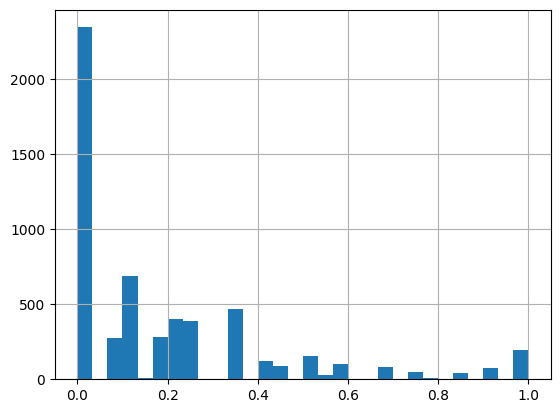

In [10]:
child_keywords = [
    'child', 'children', 'kid', 'kids', 'little girl', 'little boy',
    'baby', 'toddler', 'infant', 'teenager', 'teen', 'young girl',
    'young boy', 'daughter', 'son', 'girl', 'boy', 'childhood',
    'preschooler', 'kindergartener', 'schoolgirl', 'schoolboy'
]

def contains_kid(text):
    if not isinstance(text, str):
        return False
    text_lower = text.lower()
    for kw in child_keywords:
        if kw in text_lower:
            return True
    return False

df_to_explain = df[df['proba']>=0.4]
df_to_explain['is_child'] = df['query_text'].apply(contains_kid)
print('Кол-во уникальных текстов:',df_to_explain[df_to_explain['is_child']==True]['query_text'].nunique())
print('Кол-во уникальных фото:',df_to_explain[df_to_explain['is_child']==True]['image'].nunique())
print('Уникальные описания (первые 10)')
kid_images = df_to_explain[df_to_explain['is_child']==True]['image'].unique()
df_to_explain[df_to_explain['is_child']==True]['query_text'].unique()[:10]

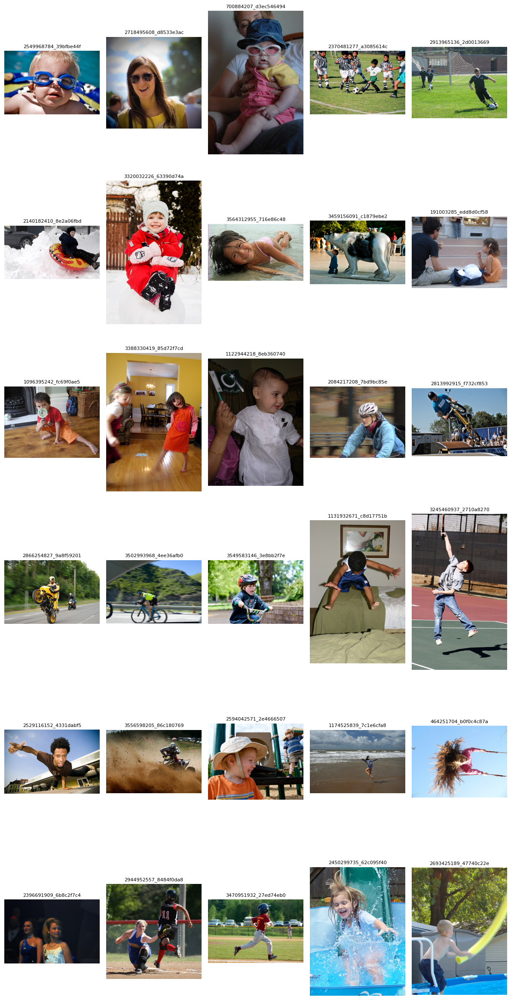

In [11]:
IMAGE_DIR = "D:/Рабочий стол/to_upload/train_images"  
child_images = df_to_explain[df_to_explain['is_child'] == True]['image'].unique()
n = min(len(child_images), 30)
cols = 5
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12, 4*rows))
axes = axes.flatten()
  
for i, img_name in enumerate(child_images[:n]):
        img_path = os.path.join(IMAGE_DIR, img_name)
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(img_name[:20], fontsize=8)
    
for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
plt.tight_layout()
plt.show()

In [12]:
print(f"Доля фото с детьми: {df_to_explain[df_to_explain['is_child']==True]['image'].nunique()/df['image'].nunique() * 100}%") 
df_filtered = df[~df['image'].isin(kid_images)]
df_filtered.info()

Доля фото с детьми: 16.400000000000002%
<class 'pandas.core.frame.DataFrame'>
Index: 4862 entries, 0 to 5820
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        4862 non-null   object 
 1   query_id     4862 non-null   object 
 2   query_text   4862 non-null   object 
 3   expert_1     4862 non-null   int64  
 4   expert_2     4862 non-null   int64  
 5   expert_3     4862 non-null   int64  
 6   ratio        4862 non-null   float64
 7   crowd_good   4862 non-null   float64
 8   crowd_bad    4862 non-null   float64
 9   true_score   4862 non-null   float64
 10  false_score  4862 non-null   float64
 11  proba        4862 non-null   float64
dtypes: float64(6), int64(3), object(3)
memory usage: 493.8+ KB


**Вывод**:\
По ключевым словам обнаружено 164 изображения, потенциально содержащих детей, что составляет 16,4% исходного набора изображений. После их исключения в обучающей таблице осталось 4 862 пары «изображение — текст». Метод подходит для демонстрационного решения, однако может давать ложные срабатывания.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [13]:
train_img_dir = "D:/Рабочий стол/to_upload/train_images"
test_img_dir = "D:/Рабочий стол/to_upload/test_images"

In [14]:


def loader(df, path, batch_size=16):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    flow = datagen.flow_from_dataframe(
        dataframe=df,
        directory=path,
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode=None,
        seed=42,
        shuffle=False)
    return flow

def create_model(input_shape=(224, 224, 3)):
    backbone = ResNet50(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False,
        pooling='avg'   
    )
    return backbone

def extract_image_embeddings(model, flow, num_images):
    steps = int(np.ceil(num_images / flow.batch_size))
    embeddings = model.predict(
        flow,
        steps=steps,
        verbose=1)
    embeddings = embeddings[:num_images]
    return embeddings.astype(np.float32)

# Создаём модель
model = create_model()

# Загружаем данные
unique_train_images = df_filtered[['image']].drop_duplicates().reset_index(drop=True)
train_flow = loader(unique_train_images, train_img_dir, batch_size=32)
train_embeddings = extract_image_embeddings(model, train_flow, len(unique_train_images))

print("Размер выхода ResNet50:", model.output_shape)
print("Уникальных train-изображений:", len(unique_train_images))
print("Найдено train-файлов:", train_flow.samples)
print("train_embeddings:", train_embeddings.shape)

Found 836 validated image filenames.
27/27 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step
Размер выхода ResNet50: (None, 2048)
Уникальных train-изображений: 836
Найдено train-файлов: 836
train_embeddings: (836, 2048)


In [15]:
train_image_vectors = {
    filename: embedding
    for filename, embedding in zip(
        train_flow.filenames,
        train_embeddings
    )
}

print("Векторов train:", len(train_image_vectors))

Векторов train: 836


In [16]:
first_image = train_flow.filenames[0]
first_vector = train_image_vectors[first_image]

print("Название изображения:", first_image)
print("Размер вектора:", first_vector.shape)
print("Первые 10 значений:", first_vector[:10])

Название изображения: 1056338697_4f7d7ce270.jpg
Размер вектора: (2048,)
Первые 10 значений: [8.6566247e-02 1.1652221e-03 0.0000000e+00 2.4696391e+00 1.7137418e-02
 0.0000000e+00 3.2276091e-01 7.4239701e-01 1.1967698e-02 3.8072073e+00]


In [17]:
# Для каждой строки исходного DataFrame находим вектор соответствующего изображения.
train_mapped_vectors = df_filtered["image"].map(train_image_vectors)
X_train_image = np.stack(train_mapped_vectors.to_numpy()).astype(np.float32)

print("X_train_image:", X_train_image.shape)

X_train_image: (4862, 2048)


**Вывод**:\
Использовали ResNet50 для векторизации изображений. Получили размер вектора на тренировочной выборке = (4862, 2048)


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [18]:
lemmatizer = WordNetLemmatizer()
pos_mapping = {
    "J": wordnet.ADJ,
    "V": wordnet.VERB,
    "N": wordnet.NOUN,
    "R": wordnet.ADV
}

def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r"[^a-z\s]", " ", text)
    tokens = text.split()
    tagged_tokens = nltk.pos_tag(tokens,lang="eng")
    lemmas = []
    for word, tag in tagged_tokens:
        wordnet_pos = pos_mapping.get(tag[0],wordnet.NOUN)
        lemma = lemmatizer.lemmatize(word,pos=wordnet_pos)
        lemmas.append(lemma)

    return " ".join(lemmas)

    
# Создаём векторизатор
tfidf = TfidfVectorizer(
    max_features=5000,
    min_df=2,
    max_df=0.90,
    dtype=np.float32,
    stop_words='english',
    ngram_range=(1, 2)
)
# Получаем очищенные текста
train_clean_text = df_filtered['query_text'].apply(clean_text)

print("Пример очистки текста:")
print("Исходный текст:")
print(df_filtered['query_text'].iloc[0])

print("\nОчищенный текст:")
print(train_clean_text.iloc[0],'\n')

X_train_text = tfidf.fit_transform(train_clean_text).toarray()

print("X_train_text:", X_train_text.shape)

Пример очистки текста:
Исходный текст:
A young child is wearing blue goggles and sitting in a float in a pool .

Очищенный текст:
a young child be wear blue goggles and sit in a float in a pool 

X_train_text: (4862, 4189)


**Вывод** \
Тексты приведены к нижнему регистру, от символов и лемматизированы с учётом части речи. TF-IDF учитывает униграммы и биграммы, удаляет английские стоп-слова и оставляет 4 189 признаков. 

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [19]:

union_vector_train = np.concatenate((X_train_image, X_train_text), axis=1)
target = np.array(df_filtered[['proba']])

print('Размер тренировочной матрицы',union_vector_train.shape)
print('Размер таргета',target.shape)

Размер тренировочной матрицы (4862, 6237)
Размер таргета (4862, 1)


**Вывод.** \
Признаки изображения и текста объединены по столбцам. Итоговая матрица содержит 4 862 объекта и 6 237 признаков: 2 048 признаков изображения и 4 189 признаков текста. 

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [20]:
X = df_filtered.drop(columns=['proba'])
y = df_filtered['proba']

gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_filtered['image']))

X_train = union_vector_train[train_indices]
X_valid = union_vector_train[test_indices]

y_train = target[train_indices]
y_valid = target[test_indices]

In [21]:

baseline_predictions = np.full(shape=len(y_valid), fill_value=np.mean(y_train),dtype=np.float32)
baseline_mae = mean_absolute_error(y_valid, baseline_predictions)

baseline_rmse = np.sqrt(mean_squared_error(y_valid, baseline_predictions))

print(f"Baseline MAE:  {baseline_mae:.4f}")
print(f"Baseline RMSE: {baseline_rmse:.4f}")


Baseline MAE:  0.1819
Baseline RMSE: 0.2443


In [22]:
%%time

xgb_model = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=500,
    learning_rate=0.03,
    max_depth=8,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_alpha=0.1,
    reg_lambda=1,
    gamma=0,
    min_child_weight=11,
    tree_method="hist",
    early_stopping_rounds=50,
    eval_metric="mae",
    random_state=42,
    n_jobs=-1
)


xgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_valid, y_valid)],
    verbose=100)

xgb_valid_predictions = xgb_model.predict(X_valid)
xgb_valid_predictions = np.clip(xgb_valid_predictions,0,1)

xgb_mae = mean_absolute_error(y_valid,xgb_valid_predictions)
xgb_rmse = np.sqrt(mean_squared_error(y_valid,xgb_valid_predictions))
xgb_r2 = r2_score(y_valid,xgb_valid_predictions)

print(f"XGBoost MAE:  {xgb_mae:.4f}")
print(f"XGBoost RMSE: {xgb_rmse:.4f}")
print(f"XGBoost R²:   {xgb_r2:.4f}")


[0]	validation_0-mae:0.18038
[100]	validation_0-mae:0.14534
[200]	validation_0-mae:0.14315
[300]	validation_0-mae:0.14253
[400]	validation_0-mae:0.14197
[471]	validation_0-mae:0.14191
XGBoost MAE:  0.1418
XGBoost RMSE: 0.1976
XGBoost R²:   0.3451
CPU times: total: 35min 48s
Wall time: 3min 44s


Код ниже выполнятся более 40 минут, после выполненения были взяты параметры лучшей модели
```
%%time

xgb_model2 = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=200,
    tree_method="hist",
    #early_stopping_rounds=20,
    #eval_metric="mae",
    random_state=123,
    n_jobs=-1
)
param_distributions = {
    "learning_rate": [0.01, 0.03, 0.1],
    "max_depth": [3,4,5,6,7,8, 9],
    "min_child_weight": [1,2,3,4,5,9,10, 11],
    "subsample": [0.6, 0.7, 0.9],
    "colsample_bytree": [0.5, 0.7, 0.9],
    "gamma": [0, 0.2, 0.5, 0.8],
    "reg_alpha": [0.01, 0.1, 0.5, 1, 3],
    "reg_lambda": [0.1, 0.5, 1, 5, 10, 15]
}


group_cv = GroupKFold(n_splits=3)
groups_train = X["image"].to_numpy()

random_search = RandomizedSearchCV(
    estimator=xgb_model2,
    param_distributions=param_distributions,
    n_iter=20,
    scoring="neg_mean_absolute_error",
    cv=group_cv,
    refit=True,
    n_jobs=1,
    verbose=2,
    random_state=123
)

random_search.fit(union_vector_train, target, groups=groups_train)
model2 = random_search.best_estimator_
random_search.best_params_
print(f"Лучший средний CV MAE: {-random_search.best_score_:.4f}")
```

In [23]:
pd.DataFrame({
    'Модель':['Предсказание среднего','XGB'],
    'MAE':[baseline_mae, xgb_mae],
    'RMSE':[baseline_rmse, xgb_rmse ]
})


,Модель,MAE,RMSE
0,Предсказание среднего,0.181902,0.244285
1,XGB,0.141800,0.197617


**Вывод** 
 - Данные разделены в пропорции 70:30 с группировкой по имени изображения. Такое разбиение предотвращает утечку данных и даёт более честную оценку способности модели работать с новыми изображениями.
 - Константная модель, предсказывающая среднее значение целевой переменной, получила MAE = 0.1819 и RMSE = 0.2443. Эти значения используются как нижняя граница качества: обучаемая модель должна показать меньшую ошибку, иначе использование объединённых признаков изображения и текста не даёт преимущества.
 - XGBoost получил MAE = 0.1418, RMSE = 0.1976. По сравнению с константной моделью MAE уменьшилась примерно на 22%, а RMSE — на 19%. Следовательно, модель действительно извлекает полезную зависимость из признаков текста и изображения.
 - Для основной оценки выбрана MAE, поскольку она измеряется в единицах таргета и легко интерпретируется.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [24]:
random_queries = test_q['query_text'].drop_duplicates().sample(n=10, random_state=42).reset_index(drop=True)

clean_q = random_queries.apply(clean_text)
X_text = tfidf.transform(clean_q).toarray().astype(np.float32)

print("Размер X_text:", X_text.shape)

unique_images = test_im[['image']].drop_duplicates().reset_index(drop=True)
flow = loader(unique_images, test_img_dir, batch_size=32)
X_image = extract_image_embeddings(model, flow, len(unique_images)).astype(np.float32)

print("Размер X_image:", X_image.shape)

Размер X_text: (10, 4189)
Found 100 validated image filenames.
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step
Размер X_image: (100, 2048)


In [25]:
total_df = pd.merge(
    random_queries.reset_index().rename(columns={'index': 'text_id'}),
    unique_images.reset_index().rename(columns={'index': 'image_id'}),
    how ='cross')

text_ids = total_df["text_id"].to_numpy()
image_ids = total_df["image_id"].to_numpy()

X_image_total = X_image[image_ids]
X_text_total = X_text[text_ids]

print("X_image_total:", X_image_total.shape)
print("X_text_total:", X_text_total.shape)

union_vector = np.concatenate((X_image_total, X_text_total), axis=1)

print("union_vector:", union_vector.shape)

X_image_total: (1000, 2048)
X_text_total: (1000, 4189)
union_vector: (1000, 6237)


In [26]:
preds = np.clip(xgb_model.predict(union_vector), 0, 1)
total_df['preds'] = preds
top_3_results = (
    total_df
    .sort_values(["text_id", "preds"],ascending=[True, False])
    .groupby("text_id",group_keys=False)
    .head(3)
    .reset_index(drop=True)
)

print("Размер результата:", top_3_results.shape)


Размер результата: (30, 5)


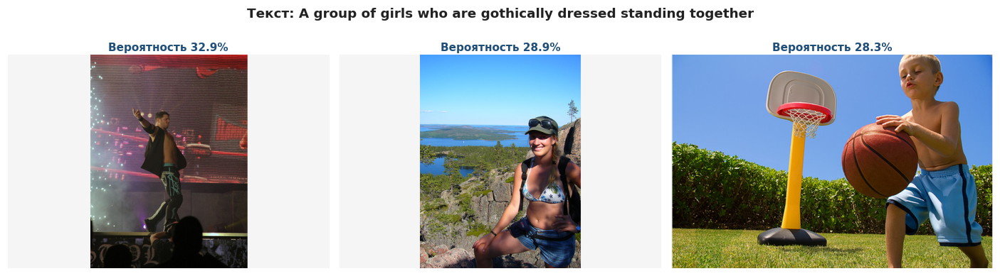

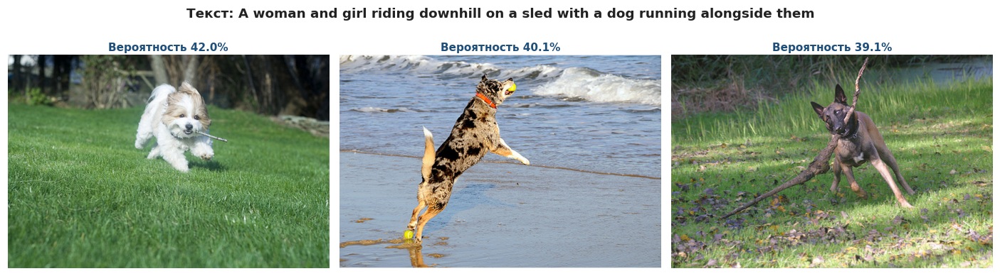

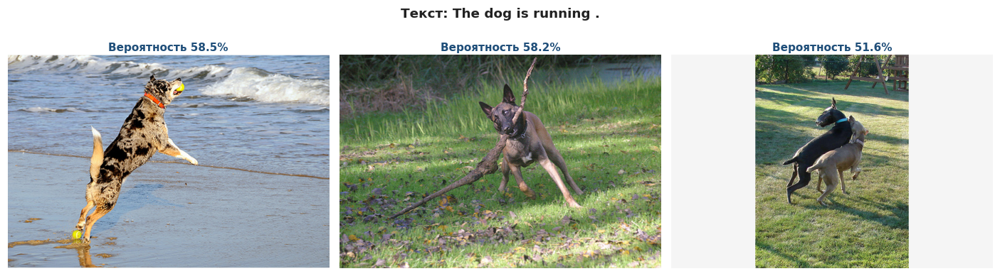

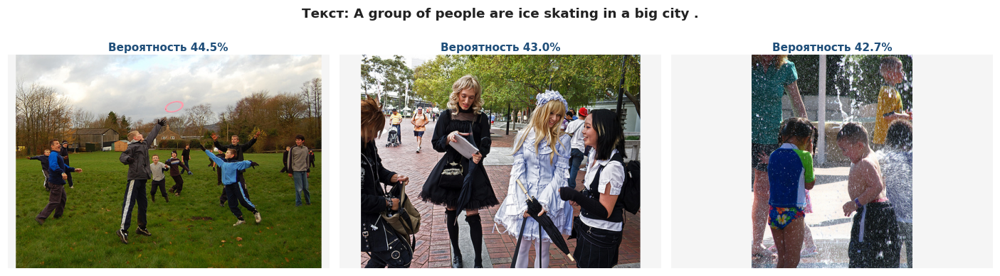

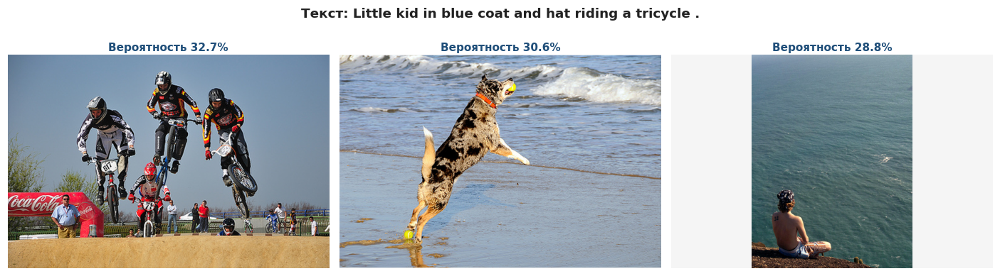

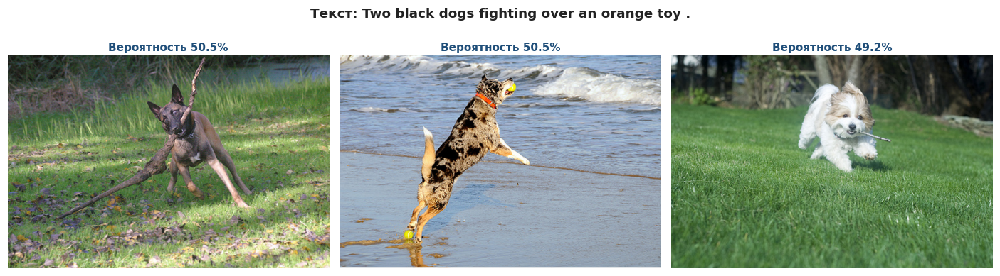

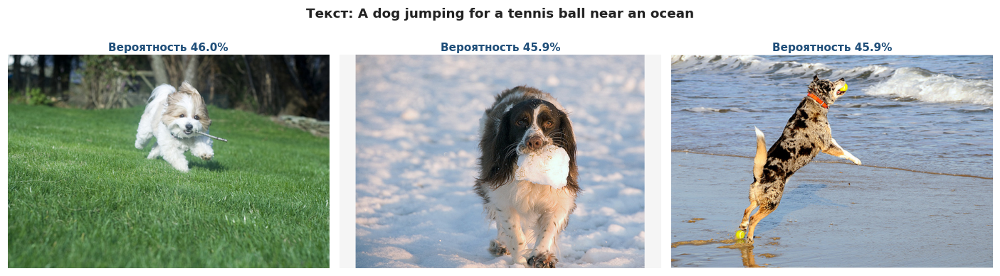

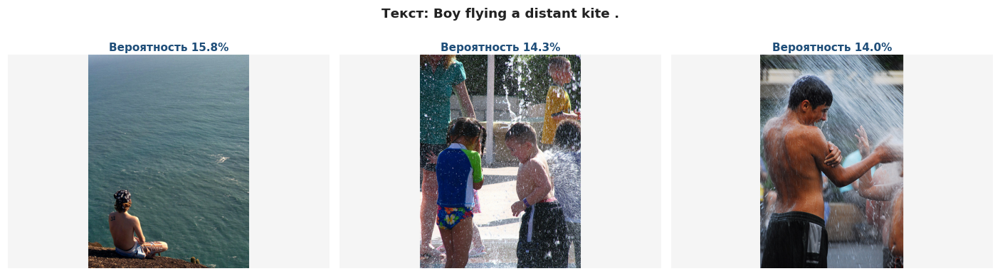

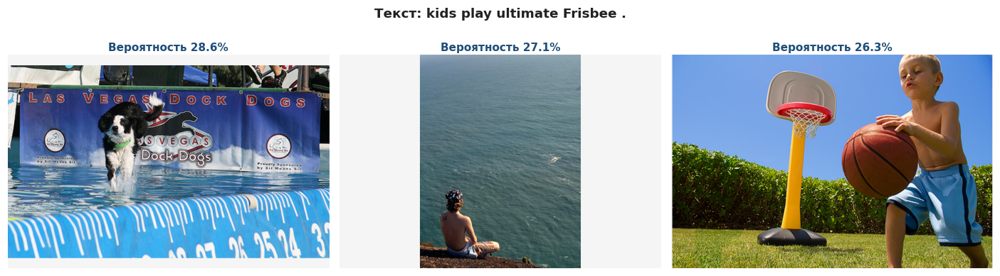

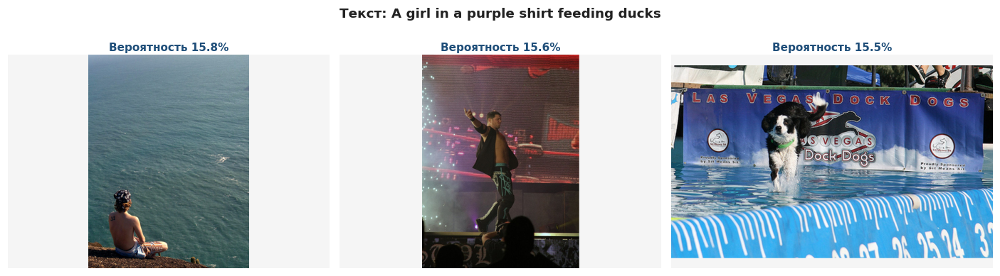

In [27]:

def prepare_image(image_path, size=(600, 400)):
    with Image.open(image_path) as image:
        image = image.convert("RGB")
        image = ImageOps.pad(
            image,
            size=size,
            method=Image.Resampling.LANCZOS,
            color=(245, 245, 245),
            centering=(0.5, 0.5)
        )

        return np.asarray(image)



for text_id, group in top_3_results.groupby("text_id",sort=True):
    group = (group.sort_values("preds",ascending=False).reset_index(drop=True))
    query_text = group["query_text"].iloc[0]
    fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(13, 3.8),dpi=110)
    wrapped_text = textwrap.fill(query_text,width=110)
    fig.text(
        x=0.5,
        y=0.96,
        s=f"Текст: {wrapped_text}",
        ha="center",
        va="top",
        fontsize=12,
        fontweight="bold",
        color="#222222"
    )

    for rank, (axis, (_, row)) in enumerate(zip(axes, group.iterrows()),start=1):
        image_path = os.path.join(test_img_dir,row["image"])
        image_array = prepare_image(image_path,size=(600, 400))
        axis.imshow(image_array)
        axis.axis("off")
        axis.set_title(
            f"Вероятность {row['preds']*100:.1f}%",
            fontsize=10,
            fontweight="semibold",
            color="#1f4e79",
            pad=4
        )

    fig.subplots_adjust(
        left=0.015,
        right=0.985,
        bottom=0.08,
        top=0.80,
        wspace=0.025
    )

    plt.show()
    plt.close(fig)

**Вывод** 
 - Для демонстрации случайно выбраны 10 уникальных запросов.
 - Всего сформировано 1 000 комбинаций: каждый из 10 запросов сопоставлен с каждым из 100 изображений.
 - Для каждого запроса показаны три изображения в порядке убывания предсказанной вероятности
 - В целом видно, что модель не случайно угадывает. Модель распознает группы людей, собак и тд. Однако необходимо добавить детей в обучающий набор данных

## 8. Выводы

В проекте построен полный прототип поиска изображений по текстовому запросу. Экспертная и краудсорсинговая разметка объединена в целевую оценку соответствия от 0 до 1. Из обучающего набора исключены 164 изображения, потенциально подпадающие под юридические ограничения, после чего осталось 4 862 обучающих пары.

Изображения представлены 2 048 признаками ResNet50, а тексты — 4 189 TF-IDF-признаками после очистки и лемматизации. После объединения получена матрица из 6 237 признаков. Групповое разбиение по изображениям исключило попадание одного изображения одновременно в обучение и валидацию.

XGBoost достиг MAE = 0.14 и RMSE = 0.19 против 0.18 и 0.24 у константной модели. Снижение ошибок примерно на 22% и 19% соответственно подтверждает, что объединённые признаки содержат полезную информацию о соответствии текста изображению. 

На тестовом этапе для 10 случайных запросов оценены все 100 изображений. Для каждого запроса выведены три фотографии с наибольшей прогнозируемой вероятностью. 

Демонстрация полностью удалась


- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска